In [1]:
!pip install torch torchvision scikit-learn matplotlib pandas pillow


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ViT_B_16_Weights.IMAGENET1K_V1`. You can also use `weights=ViT_B_16_Weights.DEFAULT` to get the most u

Epoch 1/20:
  Train Loss: 1.0515, Train Accuracy: 0.2031
  Val Loss: 1.0250, Val Accuracy: 0.4925
Epoch 2/20:
  Train Loss: 1.0243, Train Accuracy: 0.2670
  Val Loss: 1.0234, Val Accuracy: 0.1460
Epoch 3/20:
  Train Loss: 1.0157, Train Accuracy: 0.3360
  Val Loss: 0.9922, Val Accuracy: 0.6030
Epoch 4/20:
  Train Loss: 1.0028, Train Accuracy: 0.4182
  Val Loss: 0.9631, Val Accuracy: 0.4693
Epoch 5/20:
  Train Loss: 0.9751, Train Accuracy: 0.4278
  Val Loss: 0.9241, Val Accuracy: 0.5252
Epoch 6/20:
  Train Loss: 0.9763, Train Accuracy: 0.3909
  Val Loss: 0.9931, Val Accuracy: 0.5225
Epoch 7/20:
  Train Loss: 0.9361, Train Accuracy: 0.4394
  Val Loss: 0.8752, Val Accuracy: 0.5662
Epoch 8/20:
  Train Loss: 0.9085, Train Accuracy: 0.4394
  Val Loss: 0.8453, Val Accuracy: 0.5566
Epoch 9/20:
  Train Loss: 0.8717, Train Accuracy: 0.4705
  Val Loss: 0.8109, Val Accuracy: 0.5525
Epoch 10/20:
  Train Loss: 0.8340, Train Accuracy: 0.5135
  Val Loss: 0.8483, Val Accuracy: 0.5689
Epoch 11/20:
  Trai

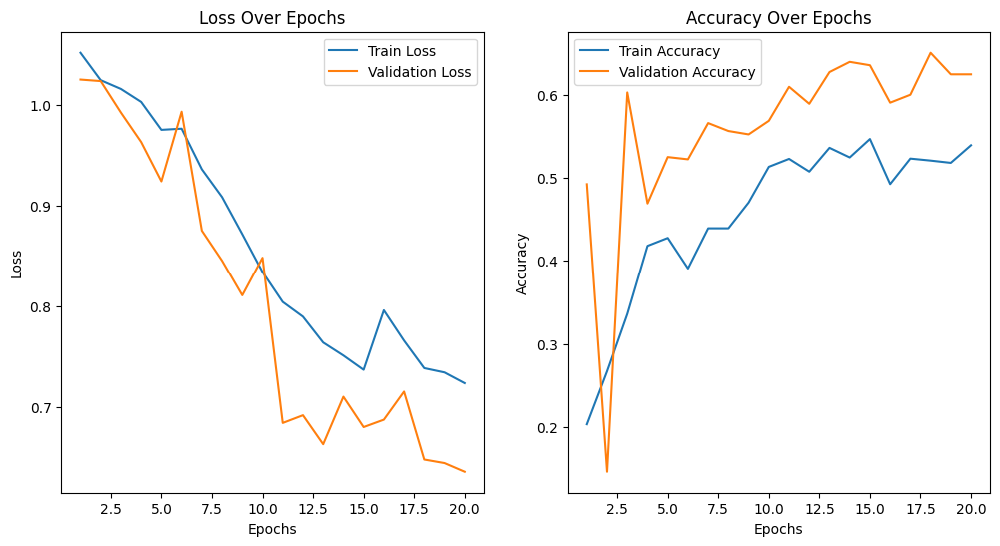

Confusion Matrix:
[[358   2   0   1   0]
 [ 36  14  19   5   0]
 [ 50  20  52  78   0]
 [  2   0   5  32   0]
 [ 11   3  16  27   2]]
Classification Report:
               precision    recall  f1-score   support

        No DR       0.78      0.99      0.88       361
         Mild       0.36      0.19      0.25        74
     Moderate       0.57      0.26      0.36       200
       Severe       0.22      0.82      0.35        39
Proliferative       1.00      0.03      0.07        59

     accuracy                           0.62       733
    macro avg       0.59      0.46      0.38       733
 weighted avg       0.67      0.62      0.58       733



In [14]:
# Dataset paths
data_dir = '/kaggle/input/aptos2019-blindness-detection/'  # Update this path
train_csv_path = os.path.join(data_dir, 'train.csv')
train_images_dir = os.path.join(data_dir, 'train_images')
test_images_dir = os.path.join(data_dir, 'test_images')

# Load training data
train_df = pd.read_csv(train_csv_path)
train_df['image_path'] = train_df['id_code'].apply(lambda x: os.path.join(train_images_dir, f"{x}.png"))

# Train-validation split
train_df, val_df = train_test_split(
    train_df, test_size=0.2, stratify=train_df['diagnosis'], random_state=42
)

# Class counts for class weights
class_counts = train_df['diagnosis'].value_counts().sort_index().values
class_weights = 1.0 / torch.tensor(class_counts, dtype=torch.float32).to(device)

# Transformations
train_transform = transforms.Compose([
    transforms.RandomResizedCrop((224, 224)),
    transforms.RandomRotation(30),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.3),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Custom Dataset
class DRDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe.iloc[idx]['image_path']
        label = self.dataframe.iloc[idx]['diagnosis']
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Create datasets and dataloaders
train_dataset = DRDataset(train_df, transform=train_transform)
val_dataset = DRDataset(val_df, transform=val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)
# Custom Focal Loss for Class Imbalance
class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma

    def forward(self, inputs, targets):
        BCE_loss = nn.CrossEntropyLoss(weight=self.alpha)(inputs, targets)
        pt = torch.exp(-BCE_loss)
        F_loss = ((1 - pt) ** self.gamma) * BCE_loss
        return F_loss

# Define Hybrid Model
class HybridModel(nn.Module):
    def __init__(self, num_classes):
        super(HybridModel, self).__init__()
        self.efficientnet = efficientnet_b0(pretrained=True)
        self.vit = vit_b_16(pretrained=True)
        self.fc = nn.Sequential(
            nn.Linear(1000 + 1000, 512),  # 1000 (EfficientNet) + 1000 (ViT)
            nn.ReLU(),
            nn.Dropout(0.3),  # Add dropout for regularization
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x1 = self.efficientnet(x)  # EfficientNet Output
        x2 = self.vit(x)           # ViT Output
        
        # Weighted Combination: 5% EfficientNet, 95% ViT
        x = torch.cat((0.05 * x1, 0.95 * x2), dim=1)  
        x = self.fc(x)
        return x

# Model, Loss, and Optimizer
model = HybridModel(num_classes=5).to(device)

# Focal Loss for Rare Classes
alpha = 1.0 / torch.tensor(class_counts, dtype=torch.float32).to(device)
criterion = FocalLoss(alpha=alpha, gamma=2)

# Separate optimizers for feature extractors and FC layers
optimizer = optim.AdamW([
    {'params': model.efficientnet.parameters(), 'lr': 1e-6},  # Lower learning rate for EfficientNet
    {'params': model.vit.parameters(), 'lr': 1e-4},           # Higher learning rate for ViT
    {'params': model.fc.parameters(), 'lr': 1e-4}             # Normal learning rate for FC layers
], weight_decay=1e-4)

scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=5, T_mult=2)

# Modified Training Loop
def train_model(model, train_loader, val_loader, epochs):
    train_losses, val_losses = [], []
    train_accuracies, val_accuracies = [], []

    for epoch in range(epochs):
        # Training Phase
        model.train()
        running_loss, correct_preds = 0, 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()

            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            correct_preds += (outputs.argmax(1) == labels).sum().item()

        train_loss = running_loss / len(train_loader)
        train_accuracy = correct_preds / len(train_loader.dataset)
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)

        # Validation Phase
        model.eval()
        val_loss, val_correct = 0, 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item()
                val_correct += (outputs.argmax(1) == labels).sum().item()

        val_loss /= len(val_loader)
        val_accuracy = val_correct / len(val_loader.dataset)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f"Epoch {epoch+1}/{epochs}:")
        print(f"  Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")
        print(f"  Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}")

        scheduler.step()

    return train_losses, val_losses, train_accuracies, val_accuracies

# Train the Model
epochs = 20  # Increase epochs to allow for better convergence
train_losses, val_losses, train_accuracies, val_accuracies = train_model(model, train_loader, val_loader, epochs)

# Plot Loss and Accuracy
plt.figure(figsize=(12, 6))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(range(1, epochs + 1), train_losses, label="Train Loss")
plt.plot(range(1, epochs + 1), val_losses, label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss Over Epochs")
plt.legend()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(range(1, epochs + 1), train_accuracies, label="Train Accuracy")
plt.plot(range(1, epochs + 1), val_accuracies, label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy Over Epochs")
plt.legend()

plt.show()

# Evaluation
test_labels, test_preds = evaluate_model(model, val_loader)  # Replace val_loader with test_loader for testing
conf_matrix = confusion_matrix(test_labels, test_preds)
print("Confusion Matrix:")
print(conf_matrix)

class_report = classification_report(test_labels, test_preds, target_names=['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative'])
print("Classification Report:")
print(class_report)


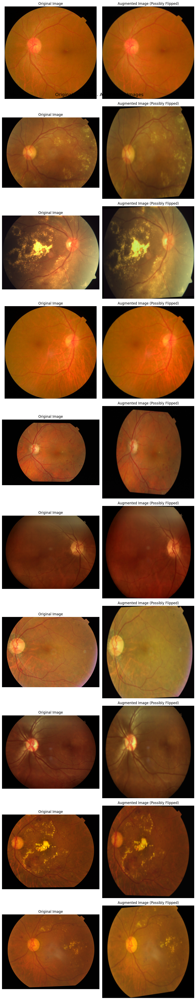

In [13]:
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image

# Augmentation without flipping
train_transform_no_flip = transforms.Compose([
    transforms.RandomRotation(degrees=5),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.0, hue=0.05),  
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# Function to visualize images with and without augmentation
def visualize_augmentations_with_flip(dataset, num_pairs=5, transform=None):
    fig, axes = plt.subplots(num_pairs, 2, figsize=(10, 5 * num_pairs))
    fig.suptitle("Original Images vs. Augmented Images", fontsize=16, y=0.9)
    
    for i in range(num_pairs):
        # Load original image
        img_path = dataset.iloc[i]['image_path']
        original_image = Image.open(img_path).convert("RGB")
        
        # Apply augmentation transform
        if transform:
            augmented_image_tensor = transform(original_image)
            augmented_image = transforms.ToPILImage()(augmented_image_tensor)  # Convert back for display
        else:
            augmented_image = original_image  # Use original if no transform provided
        
        # Display original image
        axes[i, 0].imshow(original_image)
        axes[i, 0].set_title("Original Image")
        axes[i, 0].axis("off")
        
        # Display augmented image
        axes[i, 1].imshow(augmented_image)
        if augmented_image != original_image:  # Check for flipping (rudimentary)
            axes[i, 1].set_title("Augmented Image (Possibly Flipped)")
        else:
            axes[i, 1].set_title("Augmented Image")
        axes[i, 1].axis("off")
    
    plt.tight_layout()
    plt.show()

# Call the function without flipping
visualize_augmentations_with_flip(train_df, num_pairs=10, transform=train_transform_no_flip)



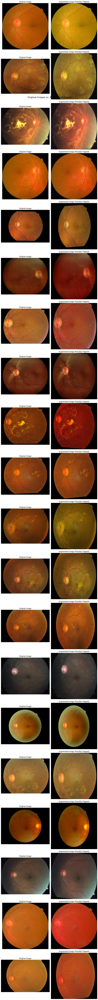

In [17]:

import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image

# Augmentation without flipping
train_transform = transforms.Compose([
    transforms.RandomResizedCrop((224, 224)),
    transforms.RandomRotation(30),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.3),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Function to visualize images with and without augmentation
def visualize_augmentations_with_flip(dataset, num_pairs=5, transform=None):
    fig, axes = plt.subplots(num_pairs, 2, figsize=(10, 5 * num_pairs))
    fig.suptitle("Original Images vs. Augmented Images", fontsize=16, y=0.9)
    
    for i in range(num_pairs):
        # Load original image
        img_path = dataset.iloc[i]['image_path']
        original_image = Image.open(img_path).convert("RGB")
        
        # Apply augmentation transform
        if transform:
            augmented_image_tensor = transform(original_image)
            augmented_image = transforms.ToPILImage()(augmented_image_tensor)  # Convert back for display
        else:
            augmented_image = original_image  # Use original if no transform provided
        
        # Display original image
        axes[i, 0].imshow(original_image)
        axes[i, 0].set_title("Original Image")
        axes[i, 0].axis("off")
        
        # Display augmented image
        axes[i, 1].imshow(augmented_image)
        if augmented_image != original_image:  # Check for flipping (rudimentary)
            axes[i, 1].set_title("Augmented Image (Possibly Flipped)")
        else:
            axes[i, 1].set_title("Augmented Image")
        axes[i, 1].axis("off")
    
    plt.tight_layout()
    plt.show()

# Call the function without flipping
visualize_augmentations_with_flip(train_df, num_pairs=20, transform=train_transform_no_flip)



In [1]:
!pip install torch torchvision scikit-learn matplotlib pandas pillow timm



Using device: cuda


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 171MB/s] 
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed 

Epoch 1/10
  Train Loss: 0.8162, Train Accuracy: 0.7143
  Val Loss: 0.6659, Val Accuracy: 0.7273
Epoch 2/10
  Train Loss: 0.5755, Train Accuracy: 0.7850
  Val Loss: 0.5483, Val Accuracy: 0.7891
Epoch 3/10
  Train Loss: 0.5094, Train Accuracy: 0.8114
  Val Loss: 0.5445, Val Accuracy: 0.7927
Epoch 4/10
  Train Loss: 0.4784, Train Accuracy: 0.8265
  Val Loss: 0.5078, Val Accuracy: 0.8218
Epoch 5/10
  Train Loss: 0.4643, Train Accuracy: 0.8207
  Val Loss: 0.4891, Val Accuracy: 0.8182
Epoch 6/10
  Train Loss: 0.3964, Train Accuracy: 0.8557
  Val Loss: 0.4711, Val Accuracy: 0.8327
Epoch 7/10
  Train Loss: 0.3638, Train Accuracy: 0.8647
  Val Loss: 0.4118, Val Accuracy: 0.8473
Epoch 8/10
  Train Loss: 0.3331, Train Accuracy: 0.8744
  Val Loss: 0.4960, Val Accuracy: 0.8000
Epoch 9/10
  Train Loss: 0.3209, Train Accuracy: 0.8798
  Val Loss: 0.4534, Val Accuracy: 0.8509
Epoch 10/10
  Train Loss: 0.3031, Train Accuracy: 0.8898
  Val Loss: 0.4780, Val Accuracy: 0.8364
Test Accuracy: 0.7891


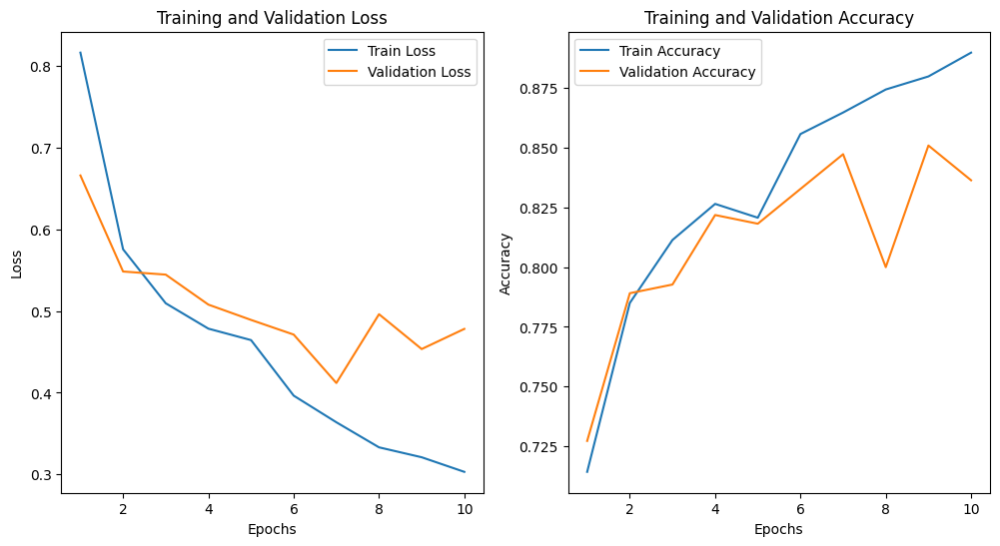

Final Test Accuracy: 0.7891


In [2]:
# Required libraries
import os
import torch
import numpy as np
import pandas as pd
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from torchvision import transforms, models
from torchvision.models import vit_b_16
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

# Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# 1. Load Dataset
data_dir = '/kaggle/input/aptos2019-blindness-detection/'  # Update this path if needed
train_csv_path = os.path.join(data_dir, 'train.csv')
train_images_dir = os.path.join(data_dir, 'train_images')

train_df = pd.read_csv(train_csv_path)
train_df['image_path'] = train_df['id_code'].apply(lambda x: os.path.join(train_images_dir, f"{x}.png"))

# Stratified train-validation split
train_df, val_df = train_test_split(train_df, test_size=0.15, stratify=train_df['diagnosis'], random_state=42)
val_df, test_df = train_test_split(val_df, test_size=0.5, stratify=val_df['diagnosis'], random_state=42)

# 2. Custom Dataset
class DRDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe.iloc[idx]['image_path']
        label = self.dataframe.iloc[idx]['diagnosis']
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# 3. Data Transformations
resnet_transform_train = transforms.Compose([
    transforms.RandomRotation(degrees=15),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.Resize((224, 224)),  # ResNet requires 224x224 input
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

resnet_transform_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Datasets and DataLoaders
train_dataset = DRDataset(train_df, transform=resnet_transform_train)
val_dataset = DRDataset(val_df, transform=resnet_transform_val)
test_dataset = DRDataset(test_df, transform=resnet_transform_val)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4)

# 4. Hybrid Model Definition with Weighted Contributions
class HybridModel(nn.Module):
    def __init__(self, num_classes):
        super(HybridModel, self).__init__()
        self.resnet = models.resnet50(pretrained=True)  # ResNet-50
        self.vit = vit_b_16(pretrained=True)  # Vision Transformer (ViT)
        self.fc = nn.Linear(1000, num_classes)  # Final classifier (1000 is from concatenation of embeddings)

    def forward(self, x):
        # ResNet and ViT share the same input size (224x224)
        x1 = self.resnet(x) * 0.05  # 5% ResNet contribution
        x2 = self.vit(x) * 0.95    # 95% ViT contribution
        x = x1 + x2                # Combine weighted outputs
        x = self.fc(x)             # Final classification
        return x

# Instantiate the modified hybrid model
model = HybridModel(num_classes=5).to(device)

# 5. Training Setup
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-4)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)

# 6. Training and Validation with Test Accuracy
def train_model_with_test_split(model, train_loader, val_loader, test_loader, epochs):
    train_losses, val_losses = [], []
    train_accuracies, val_accuracies = [], []

    for epoch in range(epochs):
        # Training phase
        model.train()
        train_loss, train_correct = 0, 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_correct += (outputs.argmax(1) == labels).sum().item()
        
        train_losses.append(train_loss / len(train_loader))
        train_accuracies.append(train_correct / len(train_loader.dataset))

        # Validation phase
        model.eval()
        val_loss, val_correct = 0, 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item()
                val_correct += (outputs.argmax(1) == labels).sum().item()
        
        val_losses.append(val_loss / len(val_loader))
        val_accuracies.append(val_correct / len(val_loader.dataset))

        print(f"Epoch {epoch+1}/{epochs}")
        print(f"  Train Loss: {train_losses[-1]:.4f}, Train Accuracy: {train_accuracies[-1]:.4f}")
        print(f"  Val Loss: {val_losses[-1]:.4f}, Val Accuracy: {val_accuracies[-1]:.4f}")

        scheduler.step()

    # Testing phase
    test_correct = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            test_correct += (outputs.argmax(1) == labels).sum().item()
    
    test_accuracy = test_correct / len(test_loader.dataset)
    print(f"Test Accuracy: {test_accuracy:.4f}")
    
    return train_losses, val_losses, train_accuracies, val_accuracies, test_accuracy

# Train the model
epochs = 10
train_losses, val_losses, train_accuracies, val_accuracies, test_accuracy = train_model_with_test_split(
    model, train_loader, val_loader, test_loader, epochs
)

# Plot Metrics
plt.figure(figsize=(12, 6))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(range(1, epochs+1), train_losses, label="Train Loss")
plt.plot(range(1, epochs+1), val_losses, label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(range(1, epochs+1), train_accuracies, label="Train Accuracy")
plt.plot(range(1, epochs+1), val_accuracies, label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()

plt.show()

print(f"Final Test Accuracy: {test_accuracy:.4f}")

# Save the model
torch.save(model.state_dict(), "diabetic_retinopathy_hybrid_model.pth")


In [3]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


In [4]:
# 9. Confusion Matrix
def plot_confusion_matrix(model, loader, class_names):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            preds = outputs.argmax(1)
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

    # Compute confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)

    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm_df, annot=True, fmt='d', cmap="YlGnBu", cbar=False)
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Classification Report
    print("Classification Report:\n")
    print(classification_report(all_labels, all_preds, target_names=class_names))

# Call the function to plot confusion matrix
class_names = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative DR']  # Update as per your class labels
plot_confusion_matrix(model, val_loader, class_names)


NameError: name 'sns' is not defined

<Figure size 1000x800 with 0 Axes>

In [5]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import numpy as np

# Function to calculate overall metrics
def evaluate_overall_metrics(model, dataloader):
    model.eval()
    all_preds, all_labels = [], []

    # Collect predictions and true labels
    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Convert to numpy arrays
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(all_labels, all_preds)
    print("Confusion Matrix:")
    print(conf_matrix)

    # Compute overall metrics
    overall_accuracy = accuracy_score(all_labels, all_preds)
    overall_precision = precision_score(all_labels, all_preds, average='macro')  # Macro: treat all classes equally
    overall_recall = recall_score(all_labels, all_preds, average='macro')
    overall_f1 = f1_score(all_labels, all_preds, average='macro')

    # Compute AUC (requires one-hot encoding)
    num_classes = len(np.unique(all_labels))
    all_labels_onehot = np.eye(num_classes)[all_labels]
    all_preds_onehot = np.eye(num_classes)[all_preds]
    overall_auc = roc_auc_score(all_labels_onehot, all_preds_onehot, average='macro', multi_class='ovr')

    # Print overall metrics
    print(f"Overall Accuracy: {overall_accuracy:.4f}")
    print(f"Overall Precision: {overall_precision:.4f}")
    print(f"Overall Recall: {overall_recall:.4f}")
    print(f"Overall F1 Score: {overall_f1:.4f}")
    print(f"Overall AUC: {overall_auc:.4f}")

    return {
        "accuracy": overall_accuracy,
        "precision": overall_precision,
        "recall": overall_recall,
        "f1_score": overall_f1,
        "auc": overall_auc
    }

# Evaluate the model on the validation set
metrics = evaluate_overall_metrics(model, val_loader)

# Optionally, save metrics
print("Final Metrics:")
for key, value in metrics.items():
    print(f"{key.capitalize()}: {value:.4f}")


Confusion Matrix:
[[132   1   2   0   0]
 [  3  15   9   1   0]
 [  0   3  69   0   3]
 [  0   1   9   3   2]
 [  0   3   8   0  11]]
Overall Accuracy: 0.8364
Overall Precision: 0.7558
Overall Recall: 0.6267
Overall F1 Score: 0.6526
Overall AUC: 0.7916
Final Metrics:
Accuracy: 0.8364
Precision: 0.7558
Recall: 0.6267
F1_score: 0.6526
Auc: 0.7916


Using device: cuda


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 116MB/s]
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights

Epoch 1/10
  Train Loss: 0.8421, Train Accuracy: 0.7015
  Val Loss: 0.6399, Val Accuracy: 0.7527
Epoch 2/10
  Train Loss: 0.6222, Train Accuracy: 0.7702
  Val Loss: 0.6055, Val Accuracy: 0.7964
Epoch 3/10
  Train Loss: 0.5290, Train Accuracy: 0.8085
  Val Loss: 0.5666, Val Accuracy: 0.7855
Epoch 4/10
  Train Loss: 0.4685, Train Accuracy: 0.8294
  Val Loss: 0.4415, Val Accuracy: 0.8509
Epoch 5/10
  Train Loss: 0.4447, Train Accuracy: 0.8300
  Val Loss: 0.5108, Val Accuracy: 0.8109
Epoch 6/10
  Train Loss: 0.3795, Train Accuracy: 0.8605
  Val Loss: 0.4565, Val Accuracy: 0.8364
Epoch 7/10
  Train Loss: 0.3474, Train Accuracy: 0.8679
  Val Loss: 0.4144, Val Accuracy: 0.8582
Epoch 8/10
  Train Loss: 0.3415, Train Accuracy: 0.8750
  Val Loss: 0.4084, Val Accuracy: 0.8545
Epoch 9/10
  Train Loss: 0.3250, Train Accuracy: 0.8834
  Val Loss: 0.4014, Val Accuracy: 0.8582
Epoch 10/10
  Train Loss: 0.2939, Train Accuracy: 0.8940
  Val Loss: 0.3965, Val Accuracy: 0.8655
Test Accuracy: 0.8000


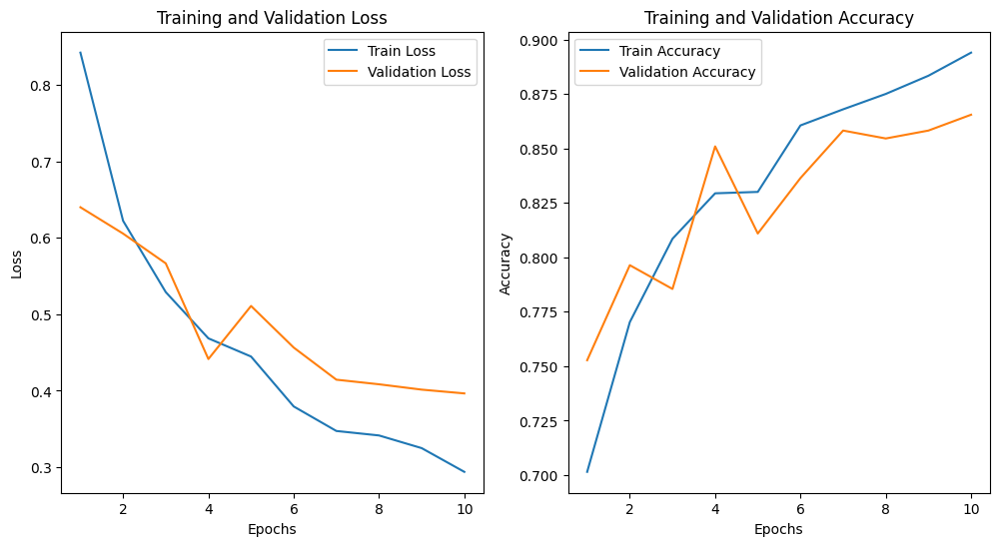

Model saved as diabetic_retinopathy_hybrid_model.pth


In [6]:
# Required libraries
import os
import torch
import numpy as np
import pandas as pd
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from torchvision import transforms
from torchvision.models import efficientnet_b0, vit_b_16
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

# Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# 1. Load Dataset
data_dir = '/kaggle/input/aptos2019-blindness-detection/'  # Update this path if needed
train_csv_path = os.path.join(data_dir, 'train.csv')
train_images_dir = os.path.join(data_dir, 'train_images')

train_df = pd.read_csv(train_csv_path)
train_df['image_path'] = train_df['id_code'].apply(lambda x: os.path.join(train_images_dir, f"{x}.png"))

# Stratified train-validation-test split
train_df, val_df = train_test_split(train_df, test_size=0.15, stratify=train_df['diagnosis'], random_state=42)
val_df, test_df = train_test_split(val_df, test_size=0.5, stratify=val_df['diagnosis'], random_state=42)

# 2. Custom Dataset
class DRDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe.iloc[idx]['image_path']
        label = self.dataframe.iloc[idx]['diagnosis']
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# 3. Data Transformations
efficientnet_transform_train = transforms.Compose([
    transforms.RandomRotation(degrees=15),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

efficientnet_transform_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Datasets and DataLoaders
train_dataset = DRDataset(train_df, transform=efficientnet_transform_train)
val_dataset = DRDataset(val_df, transform=efficientnet_transform_val)
test_dataset = DRDataset(test_df, transform=efficientnet_transform_val)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4)

# 4. Hybrid Model Definition with Adjustable Weights
class HybridModel(nn.Module):
    def __init__(self, num_classes, weight_efficientnet=0.05, weight_vit=0.95):
        super(HybridModel, self).__init__()
        self.weight_efficientnet = weight_efficientnet
        self.weight_vit = weight_vit
        self.efficientnet = efficientnet_b0(pretrained=True)
        self.vit = vit_b_16(pretrained=True)
        self.fc = nn.Linear(1000, num_classes)  # Final classifier (1000 is from concatenation of embeddings)

    def forward(self, x):
        x1 = self.efficientnet(x) * self.weight_efficientnet  # Weighted EfficientNet contribution
        x2 = self.vit(x) * self.weight_vit                    # Weighted ViT contribution
        x = x1 + x2                                           # Combine weighted outputs
        x = self.fc(x)                                        # Final classification
        return x

# Instantiate the model
model = HybridModel(num_classes=5).to(device)

# 5. Training Setup
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-4)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)

# 6. Training and Validation with Test Accuracy
def train_model_with_test_split(model, train_loader, val_loader, test_loader, epochs):
    train_losses, val_losses = [], []
    train_accuracies, val_accuracies = [], []

    for epoch in range(epochs):
        # Training phase
        model.train()
        train_loss, train_correct = 0, 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_correct += (outputs.argmax(1) == labels).sum().item()
        
        train_losses.append(train_loss / len(train_loader))
        train_accuracies.append(train_correct / len(train_loader.dataset))

        # Validation phase
        model.eval()
        val_loss, val_correct = 0, 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item()
                val_correct += (outputs.argmax(1) == labels).sum().item()
        
        val_losses.append(val_loss / len(val_loader))
        val_accuracies.append(val_correct / len(val_loader.dataset))

        print(f"Epoch {epoch+1}/{epochs}")
        print(f"  Train Loss: {train_losses[-1]:.4f}, Train Accuracy: {train_accuracies[-1]:.4f}")
        print(f"  Val Loss: {val_losses[-1]:.4f}, Val Accuracy: {val_accuracies[-1]:.4f}")

        scheduler.step()

    # Testing phase
    test_correct = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            test_correct += (outputs.argmax(1) == labels).sum().item()
    
    test_accuracy = test_correct / len(test_loader.dataset)
    print(f"Test Accuracy: {test_accuracy:.4f}")
    
    return train_losses, val_losses, train_accuracies, val_accuracies, test_accuracy

# Train the model
epochs = 10
train_losses, val_losses, train_accuracies, val_accuracies, test_accuracy = train_model_with_test_split(
    model, train_loader, val_loader, test_loader, epochs
)

# Plot Metrics
plt.figure(figsize=(12, 6))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(range(1, epochs+1), train_losses, label="Train Loss")
plt.plot(range(1, epochs+1), val_losses, label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(range(1, epochs+1), train_accuracies, label="Train Accuracy")
plt.plot(range(1, epochs+1), val_accuracies, label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()

plt.show()

# Save the model
torch.save(model.state_dict(), "diabetic_retinopathy_hybrid_model.pth")
print(f"Model saved as diabetic_retinopathy_hybrid_model.pth")


In [ ]:
# Required libraries
import os
import torch
import numpy as np
import pandas as pd
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from torchvision import transforms
from torchvision.models import efficientnet_b0, vit_b_16
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

# Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# 1. Load Dataset
data_dir = '/kaggle/input/aptos2019-blindness-detection/'  # Update this path if needed
train_csv_path = os.path.join(data_dir, 'train.csv')
train_images_dir = os.path.join(data_dir, 'train_images')

train_df = pd.read_csv(train_csv_path)
train_df['image_path'] = train_df['id_code'].apply(lambda x: os.path.join(train_images_dir, f"{x}.png"))

# Stratified train-validation-test split
train_df, val_df = train_test_split(train_df, test_size=0.15, stratify=train_df['diagnosis'], random_state=42)
val_df, test_df = train_test_split(val_df, test_size=0.5, stratify=val_df['diagnosis'], random_state=42)

# 2. Compute Class Weights
class_counts = train_df['diagnosis'].value_counts().sort_index().values
class_weights = 1.0 / torch.tensor(class_counts, dtype=torch.float)
class_weights = class_weights.to(device)
print(f"Class Weights: {class_weights}")

# 3. Custom Dataset
class DRDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe.iloc[idx]['image_path']
        label = self.dataframe.iloc[idx]['diagnosis']
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# 4. Data Transformations
efficientnet_transform_train = transforms.Compose([
    transforms.RandomRotation(degrees=15),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

efficientnet_transform_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Datasets and DataLoaders
train_dataset = DRDataset(train_df, transform=efficientnet_transform_train)
val_dataset = DRDataset(val_df, transform=efficientnet_transform_val)
test_dataset = DRDataset(test_df, transform=efficientnet_transform_val)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4)

# 5. Hybrid Model Definition with Adjustable Weights
class HybridModel(nn.Module):
    def __init__(self, num_classes, weight_efficientnet=0.05, weight_vit=0.95):
        super(HybridModel, self).__init__()
        self.weight_efficientnet = weight_efficientnet
        self.weight_vit = weight_vit
        self.efficientnet = efficientnet_b0(pretrained=True)
        self.vit = vit_b_16(pretrained=True)
        self.fc = nn.Linear(1000, num_classes)

    def forward(self, x):
        x1 = self.efficientnet(x) * self.weight_efficientnet
        x2 = self.vit(x) * self.weight_vit
        x = x1 + x2
        x = self.fc(x)
        return x

# Instantiate the model
model = HybridModel(num_classes=5).to(device)

# 6. Training Setup
criterion = nn.CrossEntropyLoss(weight=class_weights)  # Weighted loss
optimizer = optim.AdamW(model.parameters(), lr=1e-4)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)

# 7. Training and Validation with Test Accuracy
def train_model_with_test_split(model, train_loader, val_loader, test_loader, epochs):
    train_losses, val_losses = [], []
    train_accuracies, val_accuracies = [], []

    for epoch in range(epochs):
        # Training phase
        model.train()
        train_loss, train_correct = 0, 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_correct += (outputs.argmax(1) == labels).sum().item()
        
        train_losses.append(train_loss / len(train_loader))
        train_accuracies.append(train_correct / len(train_loader.dataset))

        # Validation phase
        model.eval()
        val_loss, val_correct = 0, 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item()
                val_correct += (outputs.argmax(1) == labels).sum().item()
        
        val_losses.append(val_loss / len(val_loader))
        val_accuracies.append(val_correct / len(val_loader.dataset))

        print(f"Epoch {epoch+1}/{epochs}")
        print(f"  Train Loss: {train_losses[-1]:.4f}, Train Accuracy: {train_accuracies[-1]:.4f}")
        print(f"  Val Loss: {val_losses[-1]:.4f}, Val Accuracy: {val_accuracies[-1]:.4f}")

        scheduler.step()

    # Testing phase
    test_correct = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            test_correct += (outputs.argmax(1) == labels).sum().item()
    
    test_accuracy = test_correct / len(test_loader.dataset)
    print(f"Test Accuracy: {test_accuracy:.4f}")
    
    return train_losses, val_losses, train_accuracies, val_accuracies, test_accuracy

# Train the model
epochs = 10
train_losses, val_losses, train_accuracies, val_accuracies, test_accuracy = train_model_with_test_split(
    model, train_loader, val_loader, test_loader, epochs
)

# Plot Metrics
plt.figure(figsize=(12, 6))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(range(1, epochs+1), train_losses, label="Train Loss")
plt.plot(range(1, epochs+1), val_losses, label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(range(1, epochs+1), train_accuracies, label="Train Accuracy")
plt.plot(range(1, epochs+1), val_accuracies, label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()

plt.show()

# Save the model
torch.save(model.state_dict(), "diabetic_retinopathy_hybrid_model.pth")
print(f"Model saved as diabetic_retinopathy_hybrid_model.pth")


Using device: cuda
Class Weights: tensor([0.0007, 0.0032, 0.0012, 0.0061, 0.0040], device='cuda:0')


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 128MB/s] 
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weight

Epoch 1/10
  Train Loss: 1.3792, Train Accuracy: 0.5122
  Val Loss: 1.1602, Val Accuracy: 0.7273
Epoch 2/10
  Train Loss: 0.9684, Train Accuracy: 0.7166
  Val Loss: 1.0105, Val Accuracy: 0.6364
Epoch 3/10
  Train Loss: 0.8692, Train Accuracy: 0.7535
  Val Loss: 0.8245, Val Accuracy: 0.8036
Epoch 4/10
  Train Loss: 0.7925, Train Accuracy: 0.7725
  Val Loss: 0.8503, Val Accuracy: 0.8145
Epoch 5/10
  Train Loss: 0.7386, Train Accuracy: 0.7966
  Val Loss: 0.7767, Val Accuracy: 0.8255
Epoch 6/10
  Train Loss: 0.6448, Train Accuracy: 0.8294
  Val Loss: 0.7511, Val Accuracy: 0.8327
Epoch 7/10
  Train Loss: 0.6314, Train Accuracy: 0.8246
  Val Loss: 0.7146, Val Accuracy: 0.8509
Epoch 8/10
  Train Loss: 0.5668, Train Accuracy: 0.8416
  Val Loss: 0.7548, Val Accuracy: 0.8000
Epoch 9/10
  Train Loss: 0.5745, Train Accuracy: 0.8400
  Val Loss: 0.6689, Val Accuracy: 0.8182


In [1]:
!pip install torch torchvision scikit-learn matplotlib pandas pillow timm



Using device: cuda


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 127MB/s] 
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weight

Epoch 1/10
  Train Loss: 0.8013, Train Accuracy: 0.7082
  Val Loss: 0.6128, Val Accuracy: 0.7782
Epoch 2/10
  Train Loss: 0.5862, Train Accuracy: 0.7857
  Val Loss: 0.5808, Val Accuracy: 0.7927
Epoch 3/10
  Train Loss: 0.5072, Train Accuracy: 0.8175
  Val Loss: 0.5176, Val Accuracy: 0.8327
Epoch 4/10
  Train Loss: 0.4776, Train Accuracy: 0.8242
  Val Loss: 0.4594, Val Accuracy: 0.8473
Epoch 5/10
  Train Loss: 0.4246, Train Accuracy: 0.8406
  Val Loss: 0.4625, Val Accuracy: 0.8436
Epoch 6/10
  Train Loss: 0.3824, Train Accuracy: 0.8573
  Val Loss: 0.4165, Val Accuracy: 0.8545
Epoch 7/10
  Train Loss: 0.3319, Train Accuracy: 0.8686
  Val Loss: 0.4664, Val Accuracy: 0.8436
Epoch 8/10
  Train Loss: 0.3219, Train Accuracy: 0.8840
  Val Loss: 0.4233, Val Accuracy: 0.8582
Epoch 9/10
  Train Loss: 0.2986, Train Accuracy: 0.8872
  Val Loss: 0.4521, Val Accuracy: 0.8436
Epoch 10/10
  Train Loss: 0.2720, Train Accuracy: 0.8943
  Val Loss: 0.4848, Val Accuracy: 0.8618
Test Accuracy: 0.8182


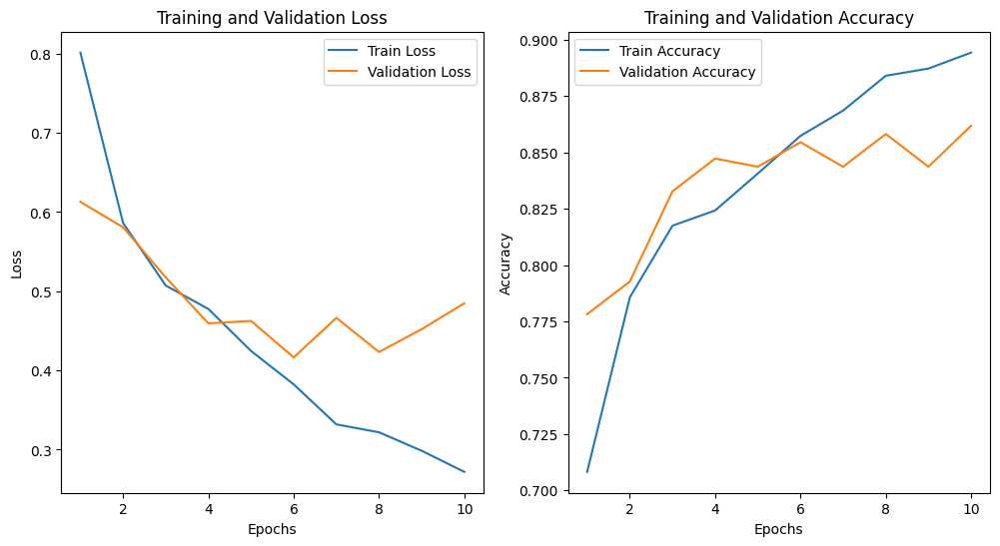

Final Test Accuracy: 0.8182


In [2]:
# Required libraries
import os
import torch
import numpy as np
import pandas as pd
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from torchvision import transforms
from torchvision.models import efficientnet_b0, vit_b_16
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

# Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# 1. Load Dataset
data_dir = '/kaggle/input/aptos2019-blindness-detection/'  # Update this path if needed
train_csv_path = os.path.join(data_dir, 'train.csv')
train_images_dir = os.path.join(data_dir, 'train_images')

train_df = pd.read_csv(train_csv_path)
train_df['image_path'] = train_df['id_code'].apply(lambda x: os.path.join(train_images_dir, f"{x}.png"))

# Stratified train-validation split
train_df, val_df = train_test_split(train_df, test_size=0.15, stratify=train_df['diagnosis'], random_state=42)
val_df, test_df = train_test_split(val_df, test_size=0.5, stratify=val_df['diagnosis'], random_state=42)

# 2. Custom Dataset
class DRDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe.iloc[idx]['image_path']
        label = self.dataframe.iloc[idx]['diagnosis']
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# 3. Data Transformations
efficientnet_transform_train = transforms.Compose([
    transforms.RandomRotation(degrees=15),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

efficientnet_transform_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Datasets and DataLoaders
train_dataset = DRDataset(train_df, transform=efficientnet_transform_train)
val_dataset = DRDataset(val_df, transform=efficientnet_transform_val)
test_dataset = DRDataset(test_df, transform=efficientnet_transform_val)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4)

# 4. Hybrid Model Definition with Weighted Contributions
class HybridModel(nn.Module):
    def __init__(self, num_classes):
        super(HybridModel, self).__init__()
        self.efficientnet = efficientnet_b0(pretrained=True)
        self.vit = vit_b_16(pretrained=True)
        self.fc = nn.Linear(1000, num_classes)  # Final classifier (1000 is from concatenation of embeddings)

    def forward(self, x):
        x1 = self.efficientnet(x) * 0.05  # 5% EfficientNet contribution
        x2 = self.vit(x) * 0.95           # 95% ViT contribution
        x = x1 + x2                       # Combine weighted outputs
        x = self.fc(x)                    # Final classification
        return x

# Instantiate the modified hybrid model
model = HybridModel(num_classes=5).to(device)


# 5. Training Setup
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-4)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)

# 6. Training and Validation with Test Accuracy
def train_model_with_test_split(model, train_loader, val_loader, test_loader, epochs):
    train_losses, val_losses = [], []
    train_accuracies, val_accuracies = [], []

    for epoch in range(epochs):
        # Training phase
        model.train()
        train_loss, train_correct = 0, 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_correct += (outputs.argmax(1) == labels).sum().item()
        
        train_losses.append(train_loss / len(train_loader))
        train_accuracies.append(train_correct / len(train_loader.dataset))

        # Validation phase
        model.eval()
        val_loss, val_correct = 0, 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item()
                val_correct += (outputs.argmax(1) == labels).sum().item()
        
        val_losses.append(val_loss / len(val_loader))
        val_accuracies.append(val_correct / len(val_loader.dataset))

        print(f"Epoch {epoch+1}/{epochs}")
        print(f"  Train Loss: {train_losses[-1]:.4f}, Train Accuracy: {train_accuracies[-1]:.4f}")
        print(f"  Val Loss: {val_losses[-1]:.4f}, Val Accuracy: {val_accuracies[-1]:.4f}")

        scheduler.step()

    # Testing phase
    test_correct = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            test_correct += (outputs.argmax(1) == labels).sum().item()
    
    test_accuracy = test_correct / len(test_loader.dataset)
    print(f"Test Accuracy: {test_accuracy:.4f}")
    
    return train_losses, val_losses, train_accuracies, val_accuracies, test_accuracy

# Train the model
epochs = 10
train_losses, val_losses, train_accuracies, val_accuracies, test_accuracy = train_model_with_test_split(
    model, train_loader, val_loader, test_loader, epochs
)

# Plot Metrics
plt.figure(figsize=(12, 6))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(range(1, epochs+1), train_losses, label="Train Loss")
plt.plot(range(1, epochs+1), val_losses, label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(range(1, epochs+1), train_accuracies, label="Train Accuracy")
plt.plot(range(1, epochs+1), val_accuracies, label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()

plt.show()

print(f"Final Test Accuracy: {test_accuracy:.4f}")

# Save the model
torch.save(model.state_dict(), "diabetic_retinopathy_hybrid_model.pth")

In [3]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


In [4]:
# 9. Confusion Matrix
def plot_confusion_matrix(model, loader, class_names):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            preds = outputs.argmax(1)
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

    # Compute confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)

    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm_df, annot=True, fmt='d', cmap="YlGnBu", cbar=False)
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Classification Report
    print("Classification Report:\n")
    print(classification_report(all_labels, all_preds, target_names=class_names))

# Call the function to plot confusion matrix
class_names = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative DR']  # Update as per your class labels
plot_confusion_matrix(model, val_loader, class_names)

NameError: name 'sns' is not defined

<Figure size 1000x800 with 0 Axes>

In [5]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import numpy as np

# Function to calculate overall metrics
def evaluate_overall_metrics(model, dataloader):
    model.eval()
    all_preds, all_labels = [], []

    # Collect predictions and true labels
    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Convert to numpy arrays
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(all_labels, all_preds)
    print("Confusion Matrix:")
    print(conf_matrix)

    # Compute overall metrics
    overall_accuracy = accuracy_score(all_labels, all_preds)
    overall_precision = precision_score(all_labels, all_preds, average='macro')  # Macro: treat all classes equally
    overall_recall = recall_score(all_labels, all_preds, average='macro')
    overall_f1 = f1_score(all_labels, all_preds, average='macro')

    # Compute AUC (requires one-hot encoding)
    num_classes = len(np.unique(all_labels))
    all_labels_onehot = np.eye(num_classes)[all_labels]
    all_preds_onehot = np.eye(num_classes)[all_preds]
    overall_auc = roc_auc_score(all_labels_onehot, all_preds_onehot, average='macro', multi_class='ovr')

    # Print overall metrics
    print(f"Overall Accuracy: {overall_accuracy:.4f}")
    print(f"Overall Precision: {overall_precision:.4f}")
    print(f"Overall Recall: {overall_recall:.4f}")
    print(f"Overall F1 Score: {overall_f1:.4f}")
    print(f"Overall AUC: {overall_auc:.4f}")

    return {
        "accuracy": overall_accuracy,
        "precision": overall_precision,
        "recall": overall_recall,
        "f1_score": overall_f1,
        "auc": overall_auc
    }

# Evaluate the model on the validation set
metrics = evaluate_overall_metrics(model, val_loader)

# Optionally, save metrics
print("Final Metrics:")
for key, value in metrics.items():
    print(f"{key.capitalize()}: {value:.4f}")


Confusion Matrix:
[[134   0   1   0   0]
 [  5  12  11   0   0]
 [  0   1  73   0   1]
 [  0   0   5   6   4]
 [  0   1   9   0  12]]
Overall Accuracy: 0.8618
Overall Precision: 0.8529
Overall Recall: 0.6680
Overall F1 Score: 0.7151
Overall AUC: 0.8146
Final Metrics:
Accuracy: 0.8618
Precision: 0.8529
Recall: 0.6680
F1_score: 0.7151
Auc: 0.8146
